In [1]:
import numpy as np
import xarray as xr
import pandas as pd
import cftime
import calendar
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.path as mpath
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib.ticker as mticker
from matplotlib.colors import TwoSlopeNorm
from matplotlib.patches import Rectangle
import imageio
import os
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import datetime #import datetime
from glob import glob

In [2]:
# dask
import dask
import dask.array as da
import distributed
from dask.distributed import Client

client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 8
Total threads: 32,Total memory: 35.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:33625,Workers: 0
Dashboard: http://127.0.0.1:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:36601,Total threads: 4
Dashboard: http://127.0.0.1:36301/status,Memory: 4.38 GiB
Nanny: tcp://127.0.0.1:36059,


In [3]:
client.close()

In [5]:
path_atm = "/nird/datapeak/NS1004K/elihho/NHIST_tropstratchem_20260116_pinatubo10tg_19_c/atm/hist"
ds = xr.open_mfdataset(f"{path_atm}/NHIST_tropstratchem_f09_tn14_20260116_Pinatubo10Tg19_02.cam.h0.*.nc", combine="by_coords", parallel=True)


In [6]:
def shift_one_month_back(t):
    if t.month == 1:
        return cftime.DatetimeNoLeap(t.year - 1, 12, t.day, t.hour, t.minute, t.second)
    else:
        return cftime.DatetimeNoLeap(t.year, t.month - 1, t.day, t.hour, t.minute, t.second)

shifted_time = np.array([shift_one_month_back(t) for t in ds['time'].values])
ds= ds.assign_coords(time=shifted_time)

print(ds["time"].values[:5])

[cftime.DatetimeNoLeap(1991, 1, 1, 0, 0, 0, 0, has_year_zero=True)
 cftime.DatetimeNoLeap(1991, 2, 1, 0, 0, 0, 0, has_year_zero=True)
 cftime.DatetimeNoLeap(1991, 3, 1, 0, 0, 0, 0, has_year_zero=True)
 cftime.DatetimeNoLeap(1991, 4, 1, 0, 0, 0, 0, has_year_zero=True)
 cftime.DatetimeNoLeap(1991, 5, 1, 0, 0, 0, 0, has_year_zero=True)]


In [7]:
lat = ds["lat"]
weighted_lat = np.cos(np.deg2rad(lat))

In [8]:
ds

<xarray.Dataset> Size: 52GB
Dimensions:               (time: 12, zlon: 1, nbnd: 2, lat: 192, lev: 32,
                           ilev: 33, lon: 288)
Coordinates:
  * lat                   (lat) float64 2kB -90.0 -89.06 -88.12 ... 89.06 90.0
  * zlon                  (zlon) float64 8B 0.0
  * lon                   (lon) float64 2kB 0.0 1.25 2.5 ... 356.2 357.5 358.8
  * lev                   (lev) float64 256B 3.643 7.595 14.36 ... 976.3 992.6
  * ilev                  (ilev) float64 264B 2.255 5.032 10.16 ... 985.1 1e+03
  * time                  (time) object 96B 1991-01-01 00:00:00 ... 1991-12-0...
Dimensions without coordinates: nbnd
Data variables: (12/2532)
    zlon_bnds             (time, zlon, nbnd) float64 192B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    gw                    (time, lat) float64 18kB dask.array<chunksize=(1, 192), meta=np.ndarray>
    hyam                  (time, lev) float64 3kB dask.array<chunksize=(1, 32), meta=np.ndarray>
    hybm                  (time, lev) float64 3kB dask.array<chunksize=(1, 32), meta=np.ndarray>
    P0                    (time) float64 96B 1e+05 1e+05 1e+05 ... 1e+05 1e+05
    hyai                  (time, ilev) float64 3kB dask.array<chunksize=(1, 33), meta=np.ndarray>
    ...                    ...
    mmr_BC                (time, lev, lat, lon) float32 85MB dask.array<chunksize=(1, 32, 192, 288), meta=np.ndarray>
    mmr_DUST              (time, lev, lat, lon) float32 85MB dask.array<chunksize=(1, 32, 192, 288), meta=np.ndarray>
    mmr_OM                (time, lev, lat, lon) float32 85MB dask.array<chunksize=(1, 32, 192, 288), meta=np.ndarray>
    mmr_SALT              (time, lev, lat, lon) float32 85MB dask.array<chunksize=(1, 32, 192, 288), meta=np.ndarray>
    mmr_SULFATE           (time, lev, lat, lon) float32 85MB dask.array<chunksize=(1, 32, 192, 288), meta=np.ndarray>
    odms                  (time, lat, lon) float32 3MB dask.array<chunksize=(1, 192, 288), meta=np.ndarray>
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              NHIST_tropstratchem_f09_tn14_20260116_Pinatubo10Tg19_02
    logname:           elihho
    host:              
    initial_file:      NHIST_tropstratchem_f09_tn14_20251110_moved2iceland.ca...
    topography_file:   /cluster/shared/noresm/inputdata/atm/cam/topo/fv_0.9x1...
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    time_period_freq:  month_1

<Figure size 700x500 with 0 Axes>

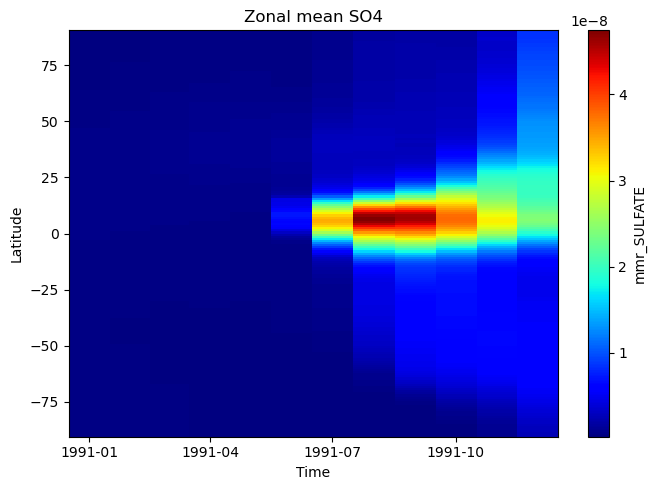

In [9]:
so4 = ds["mmr_SULFATE"].weighted(weighted_lat).mean(dim="lev")

so4_zoom = so4.sel(time=slice('1991-01-01', '1991-12-01'))
time_zoom = so4_zoom["time"].values

so4_lat_time = so4_zoom.mean(dim="lon")
lat = so4_lat_time["lat"].values

plt.figure(figsize=(7,5))
so4_lat_time.plot.pcolormesh(
    x="time",
    y="lat",
    cmap="jet",
    figsize=(7,5)
)

plt.xlabel("Time")
plt.ylabel("Latitude")
plt.title("Zonal mean SO4")
plt.tight_layout()
plt.show()


<Figure size 700x500 with 0 Axes>

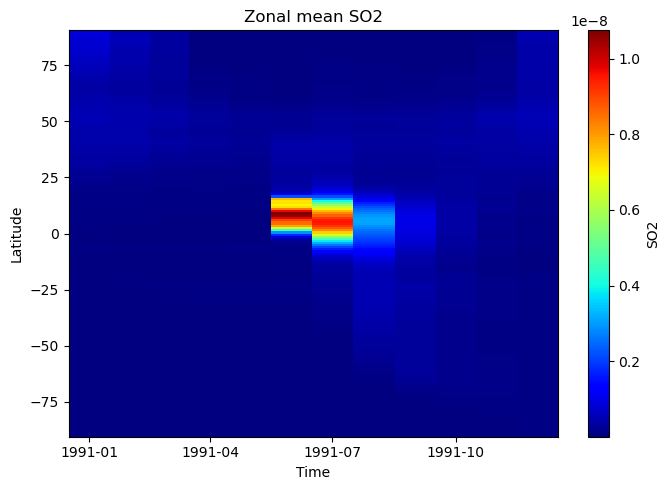

In [10]:
so2 = ds["SO2"].weighted(weighted_lat).mean(dim="lev")

so2_zoom = so2.sel(time=slice('1991-01-01', '1991-12-01'))
time_zoom = so2_zoom["time"].values

so2_lat_time = so2_zoom.mean(dim="lon")
lat = so2_lat_time["lat"].values

plt.figure(figsize=(7,5))
so2_lat_time.plot.pcolormesh(
    x="time",
    y="lat",
    cmap="jet",
    figsize=(7,5)
)

plt.xlabel("Time")
plt.ylabel("Latitude")
plt.title("Zonal mean SO2")
plt.tight_layout()
plt.show()


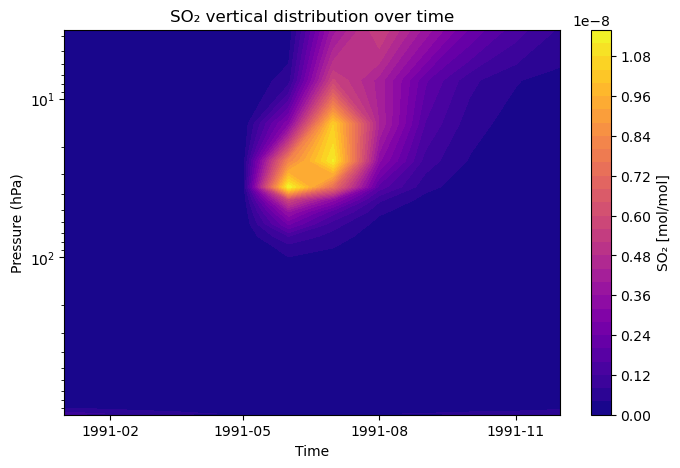

In [11]:
so2_profile = ds["SO2"].weighted(weighted_lat)
so2_time_lev = so2_profile.mean(dim=['lat','lon'])

so2_zoom = so2_time_lev.sel(time=slice('1991-01-01', '1991-12-01'))
time_zoom = so2_zoom['time'].values

time = ds['time'].values 
lev = ds['lev'].values

plt.figure(figsize=(8,5))
plt.contourf(time_zoom, lev, so2_zoom.T, levels=30, cmap='plasma')
plt.gca().invert_yaxis()
plt.yscale("log")
plt.colorbar(label='SO₂ [mol/mol]')
plt.xlabel('Time')
plt.ylabel('Pressure (hPa)')
plt.title('SO₂ vertical distribution over time')
plt.show()